# FSL-VBM Analysis with Brain Extraction
Reference: https://open.win.ox.ac.uk/pages/fslcourse/practicals/seg_struc/index.html#vbm

From the dataset, I have chosen data of nine Indiana University (IU) football players (American football) and nine controls (non-athletes) and wish to carry out an AmFB>NonAth comparison as well as NonAth>AmFB comparison.

Please check the Participants' Info Used in this Project here:

Results/Participants_INFO.csv

### [a] Define the statistical design
[a simple two-tailed t-test to compare both groups]

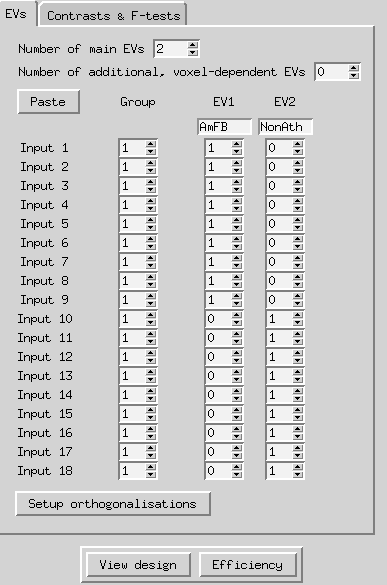

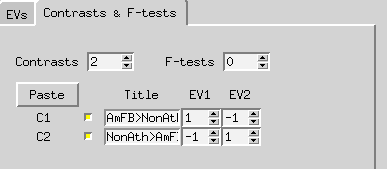

View Design

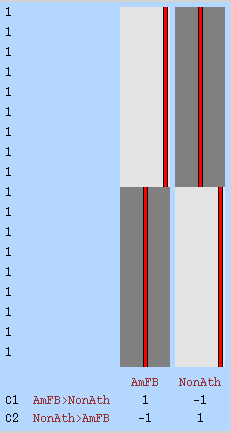

Efficiency

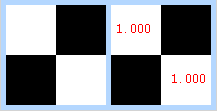

### [b] Create template_list file
Check the contents of this template_list file by doing: 

In [ ]:
cat template_list

```
sub-1_001.nii.gz
sub-1_002.nii.gz
sub-1_003.nii.gz
sub-1_005.nii.gz
sub-1_006.nii.gz
sub-1_007.nii.gz
sub-1_008.nii.gz
sub-1_009.nii.gz
sub-1_012.nii.gz
sub-3_044.nii.gz
sub-3_045.nii.gz
sub-3_046.nii.gz
sub-3_049.nii.gz
sub-3_050.nii.gz
sub-3_052.nii.gz
sub-3_053.nii.gz
sub-3_054.nii.gz
sub-3_055.nii.gz
```



## Preprocessing

[1] initial FSL-VBM script:

In [ ]:
fslvbm_1_bet -N

OUTPUT

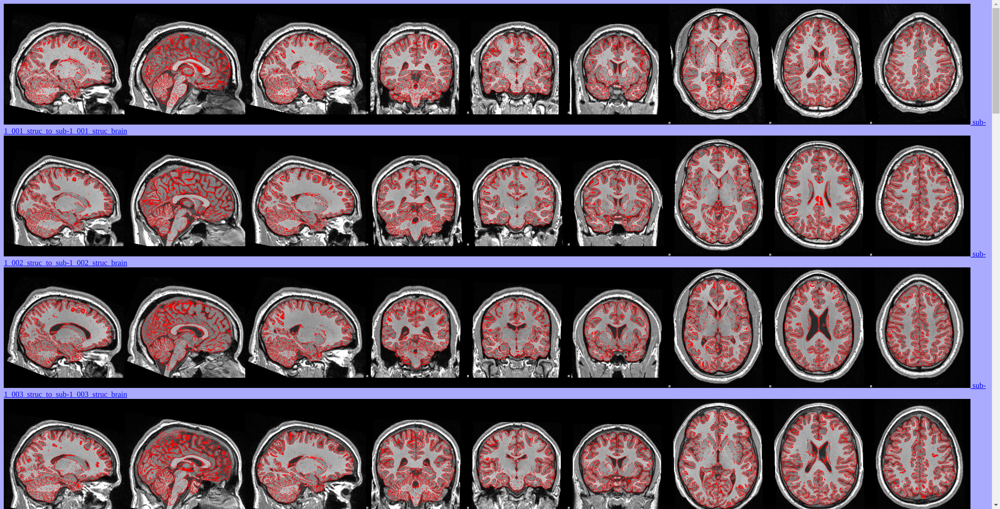

[2] All the brain images are segmented into the different tissue types, and then the study-specific GM template is created, by registering all GM segmentations to standard space, and averaging them together. The command used was:

In [ ]:
fslvbm_2_template -n

[3] View all of the alignments to the MNI152 initial standard space by running the following, and turning on FSLeyes movie mode:

In [ ]:
fsleyes -std struc/template_4D_GM -cm blue-lightblue &

OUTPUT

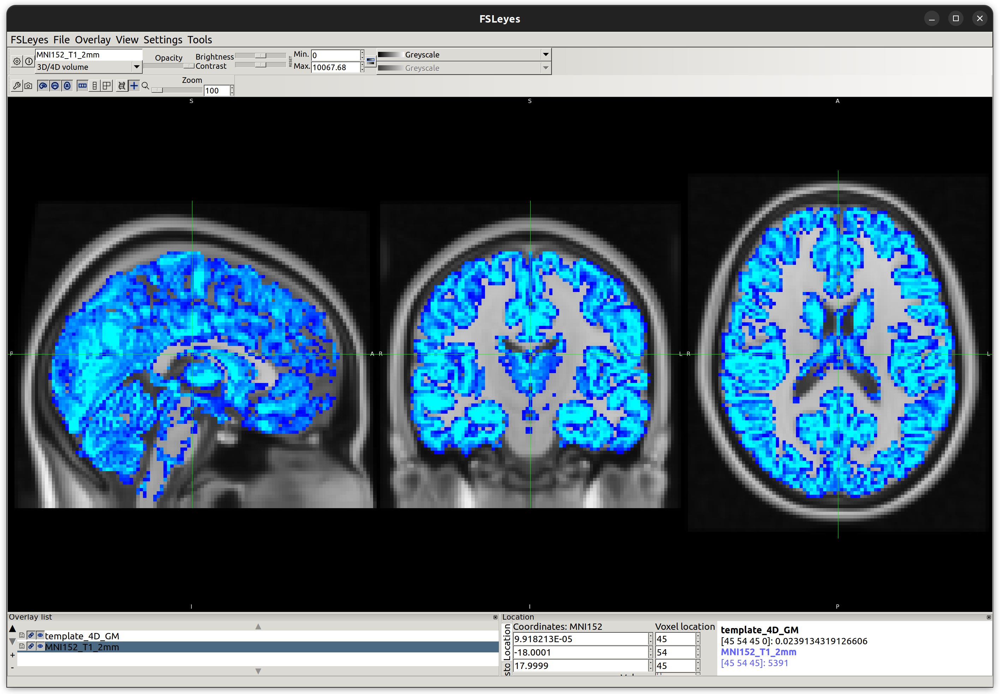

[4] then view the alignment of the study-specific template to the MNI152 standard space with:

In [ ]:
fsleyes -std struc/template_GM -cm blue-lightblue -dr 0.2 1 &

OUTPUT

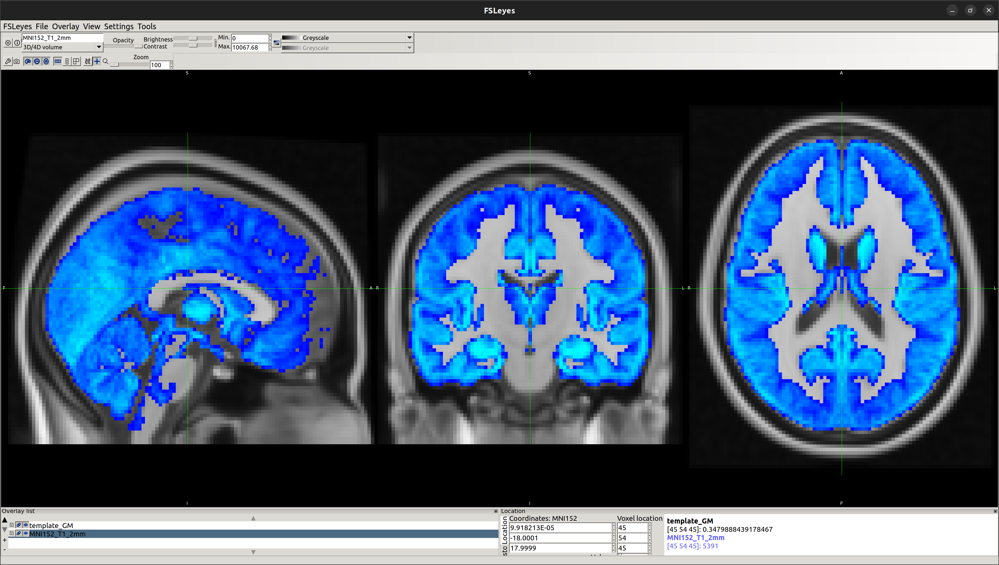

[5] Finally, the registrations to the new, study-specific, template were run for all subjects, and modulated by the warp field expansion (Jacobian), before being combined across subjects into the 4D image stats/GM_mod_merg. An initial GLM model-fit is run in order to allow you to view the raw tstat images at a range of potential smoothings. This was achieved by running:

In [ ]:
fslvbm_3_proc

[6] Now have a look at the initial raw tstat images created at the different smoothing levels, pick the one you "like" best. You can change the colour maps for each tstat in FSLeyes to more clearly see the differences.

In [ ]:
cd stats
fsleyes template_GM -dr .1 1 \
  GM_mod_merg_s4_tstat1 -dr 2.3 6 \
  GM_mod_merg_s3_tstat1 -dr 2.3 6 \
  GM_mod_merg_s2_tstat1 -dr 2.3 6 &

OUTPUT

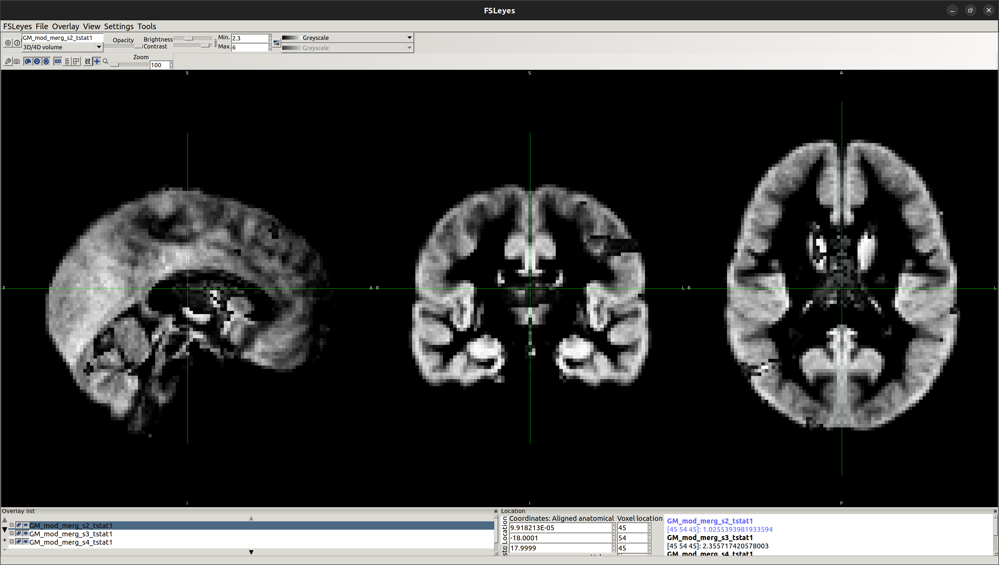

[7] now ready to carry out the cross-subject statistics. We will use randomise for this, as the above steps are very unlikely to generate nice Gaussian distributions in the data. Normally we would run at least 5000 permutations (to end up with accurate p-values):

In [ ]:
randomise -i GM_mod_merg_s3 -o tmp -m GM_mask \
  -d design.mat -t design.con -n 5000 -T

OUTPUT

```
Critical Value for: tmp_tfce_tstat1 is: 13209.8
Critical Value for: tmp_tfce_tstat2 is: 7673.45
```



[8] Once randomise has finished use FSLeyes to look at the results (corrected for multiple comparisons) showing the local differences in grey matter volume between the two groups:

In [ ]:
fsleyes template_GM -dr .1 1 \
  tmp_tfce_corrp_tstat1 -cm red-yellow -dr 0.95 1 &

OUTPUT

AmFB>NonAth

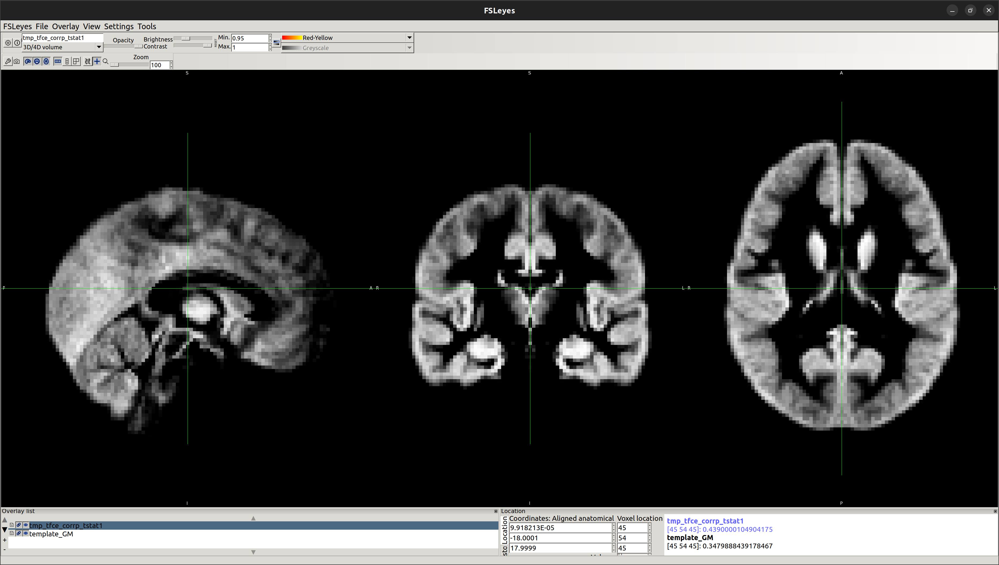

In [ ]:
fsleyes template_GM -dr .1 1 \
  tmp_tfce_corrp_tstat2 -cm red-yellow -dr 0.95 1 &

OUTPUT

NonAth>AmFB

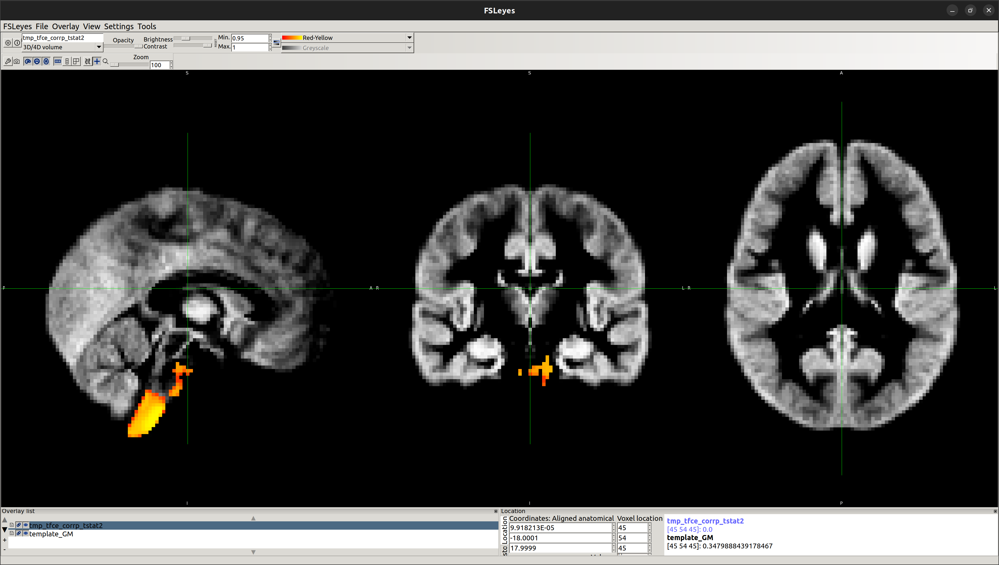



---



## To obtain statistical data, identify the region of significant difference and validate that:

### [1] E2 - Running randomise and displaying cluster-based thresholding results

Reference: https://fsl.fmrib.ox.ac.uk/fsl/fslwiki/FSLVBM/UserGuide

The following commands should be run in the "stats" folder/directory: 

In [ ]:
fslmaths tmp_tfce_corrp_tstat2 -thr 0.95 -bin mask_pcorrected

In [ ]:
fslmaths tmp_tstat2 -mas mask_pcorrected tmp_tstat2_corrected

Display

```
fsleyes $FSLDIR/data/standard/MNI152_T1_2mm 
```

* [a] Open file in fsleyes
* [b] Navigate to the "stats" folder
* [c] add the following file: mask_pcorrected.nii.gz

OUTPUT

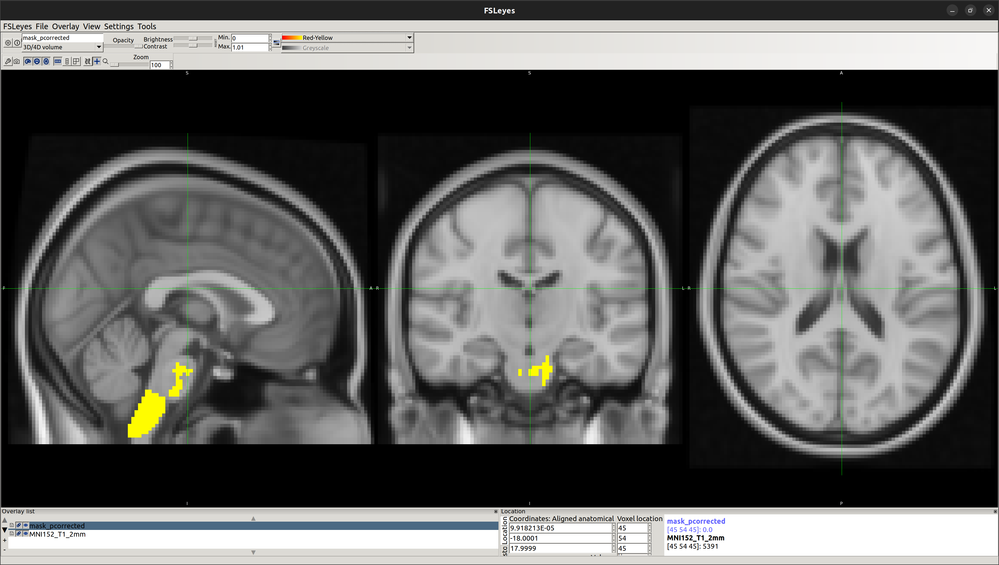

## [2] Reporting Cluster Information

Reference: https://fsl.fmrib.ox.ac.uk/fsl/fslwiki/Cluster#reporting

Corrected 1-p values with associated t-statistics (as output from randomise):

```
cluster -i tmp_tfce_corrp_tstat2 -t 0.95 -c tmp_tstat2 --scalarname="1-p" > cluster_corrp1.txt
```

*Notes: the threshold is based on the 1-p value (i.e. 0.95 = 1 - 0.05); 
the use of --scalarname means that all the table headings report "1-p" rather than "Z".*

It'll generate a text file within the "stats" folder. Open with Excel

OUTPUT

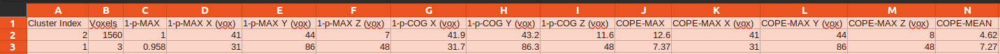

Explanation:

**Cluster Index:** a unique number for each cluster from 1 to N (larger clusters have bigger numbers)

**Voxels:** the number of voxels in the cluster

**MAX:** the value of the maximum "intensity" within the cluster (e.g. the maximum z-statistic if the input was a z-statistic image)

**MAX X/Y/Z (vox/mm):** the location of the maximum intensity voxel, given as X/Y/Z coordinate values in either voxel coordinates (vox) or standard space coordinates (mm) - the latter requires either the input image to already be in standard space or a transformation to standard space to be specified via the options -x,--xfm or --warpvol

**COG X/Y/Z (vox/mm):** the location of the Centre Of Gravity for the cluster (that is, a weighted average of the coordinates by the intensities within the cluster, equivalent to the concept of Centre Of Gravity for a object with distributed mass, where intensity substitutes for mass in this case)

If a **COPE** image is added (-c,--cope) then extra columns are added to the table, reporting the maximum COPE value, the location of this maximum and the mean COPE value over the clusters defined from the input image (i.e., clusters are not defined using the COPE image).



